In [301]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
%matplotlib inline

## Import data

In [25]:
df = pd.read_csv('gesture_phrase_dataset/a1_raw.csv')

In [133]:
df

,lhx,lhy,lhz,rhx,rhy,rhz,hx,hy,hz,sx,sy,sz,lwx,lwy,lwz,rwx,rwy,rwz,timestamp,phase
0,5.347435,4.363681,1.501913,5.258967,4.319263,1.488703,5.037871,1.618295,1.778350,5.062803,4.229656,1.772577,4.972902,4.301065,1.564781,5.553945,4.370456,1.553521,5702026,Rest
1,4.869622,4.254210,1.556133,5.240113,4.346338,1.554309,5.037610,1.618370,1.778573,5.061430,4.228504,1.772859,4.974908,4.303656,1.565527,5.423875,4.303708,1.569942,5702058,Rest
2,5.357447,4.364039,1.500969,5.238928,4.347924,1.554150,5.037514,1.618298,1.778774,5.059245,4.228004,1.773568,4.981612,4.305363,1.563643,5.332170,4.438061,1.572841,5702089,Rest
3,4.942886,4.281878,1.546513,5.111436,4.229660,1.527091,5.037526,1.618612,1.778855,5.056475,4.226891,1.774519,4.987158,4.304063,1.565929,5.311104,4.396774,1.566368,5702120,Rest
4,5.003160,4.278530,1.542866,4.985812,4.182155,1.520330,5.037557,1.619226,1.778925,5.052367,4.225485,1.775536,4.983912,4.296833,1.569889,5.193762,4.335417,1.560144,5702167,Rest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1742,4.999737,3.840355,1.577457,4.990017,4.124610,1.546410,5.092207,1.616004,1.793314,5.094342,4.235239,1.776703,4.911455,4.145016,1.575040,5.121212,4.173772,1.590187,5807375,Rest
1743,5.001617,3.840771,1.577161,4.695521,4.148509,1.530205,5.092773,1.615753,1.793486,5.094236,4.235837,1.776754,4.913334,4.145438,1.574744,5.072464,4.175019,1.580585,5807406,Rest
1744,4.996975,3.841236,1.578423,4.700123,4.141193,1.530697,5.092515,1.615095,1.793637,5.093153,4.235420,1.776905,4.908689,4.145911,1.576006,5.074112,4.178266,1.581682,5807437,Rest
1745,5.000125,3.841455,1.577914,4.690338,4.153884,1.526481,5.092476,1.614777,1.793768,5.093362,4.234446,1.777077,4.911839,4.146133,1.575497,5.058132,4.166863,1.579690,5807499,Rest


In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1747 entries, 0 to 1746
Data columns (total 20 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   lhx        1747 non-null   float64
 1   lhy        1747 non-null   float64
 2   lhz        1747 non-null   float64
 3   rhx        1747 non-null   float64
 4   rhy        1747 non-null   float64
 5   rhz        1747 non-null   float64
 6   hx         1747 non-null   float64
 7   hy         1747 non-null   float64
 8   hz         1747 non-null   float64
 9   sx         1747 non-null   float64
 10  sy         1747 non-null   float64
 11  sz         1747 non-null   float64
 12  lwx        1747 non-null   float64
 13  lwy        1747 non-null   float64
 14  lwz        1747 non-null   float64
 15  rwx        1747 non-null   float64
 16  rwy        1747 non-null   float64
 17  rwz        1747 non-null   float64
 18  timestamp  1747 non-null   int64  
 19  phase      1747 non-null   object 
dtypes: float

In [28]:
df.describe()

,lhx,lhy,lhz,rhx,rhy,rhz,hx,hy,hz,sx,sy,sz,lwx,lwy,lwz,rwx,rwy,rwz,timestamp
count,1747.000000,1747.000000,1747.000000,1747.000000,1747.000000,1747.000000,1747.000000,1747.000000,1747.000000,1747.000000,1747.000000,1747.000000,1747.000000,1747.000000,1747.000000,1747.000000,1747.000000,1747.000000,1.747000e+03
mean,4.733099,4.110179,1.492067,5.400730,3.860213,1.483939,5.084119,1.660346,1.753750,5.099306,4.264994,1.742626,4.584839,4.110311,1.521522,5.538275,3.902637,1.506997,5.739172e+06
std,0.706462,0.782359,0.064146,0.807955,0.870350,0.070478,0.181948,0.058347,0.024135,0.126167,0.061245,0.016544,0.622707,0.683990,0.061683,0.689032,0.786473,0.071968,2.796631e+04
min,1.712471,1.660291,1.183290,3.653736,1.296046,1.221158,4.435888,1.415457,1.664271,4.737700,3.992892,1.698297,1.969708,1.953082,1.245345,3.963918,1.643037,1.262197,5.702026e+06
25%,4.530557,3.698008,1.467770,4.846750,3.274578,1.458293,5.010395,1.632286,1.742879,5.041478,4.235906,1.734145,4.417056,3.816689,1.502152,5.084478,3.404305,1.478446,5.718500e+06
50%,4.870256,4.266777,1.487985,5.199142,4.122335,1.487003,5.073397,1.655894,1.757832,5.074966,4.272721,1.740951,4.717515,4.236164,1.531247,5.368165,4.146416,1.521121,5.734350e+06
75%,5.153918,4.737138,1.524848,5.817285,4.374306,1.517132,5.167158,1.678649,1.766783,5.141455,4.297685,1.748727,4.936841,4.602459,1.554412,5.845651,4.387562,1.544963,5.751136e+06
max,6.212834,5.414431,1.673418,8.546903,5.453834,1.722231,5.605544,1.965343,1.853095,5.586325,4.822887,1.811931,5.798482,5.142542,1.668777,8.266059,5.240774,1.719505,5.807537e+06


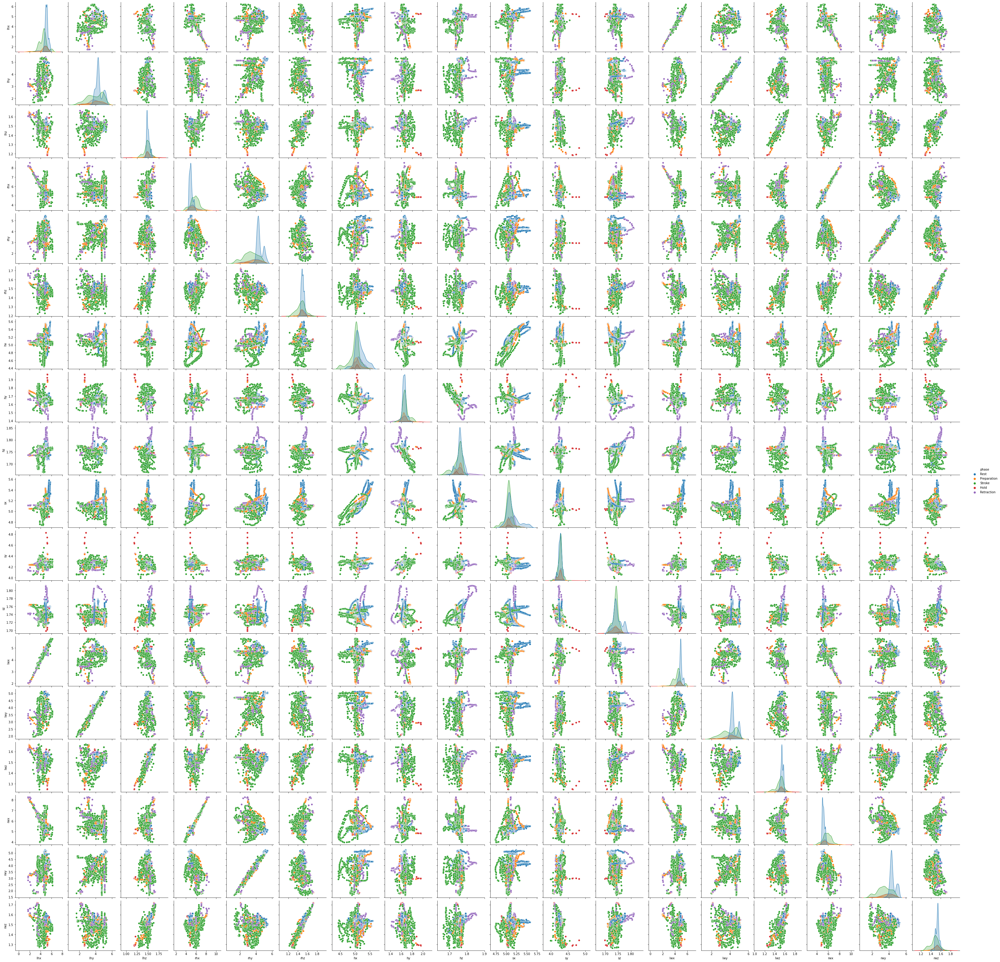

In [269]:
sns.pairplot(df, vars=['lhx', 'lhy', 'lhz',
                       'rhx', 'rhy', 'rhz', 
                       'hx',  'hy',  'hz', 
                       'sx',  'sy',  'sz', 
                       'lwx', 'lwy', 'lwz', 
                       'rwx', 'rwy', 'rwz'],hue='phase',)

Text(0, 0.5, 'Position')

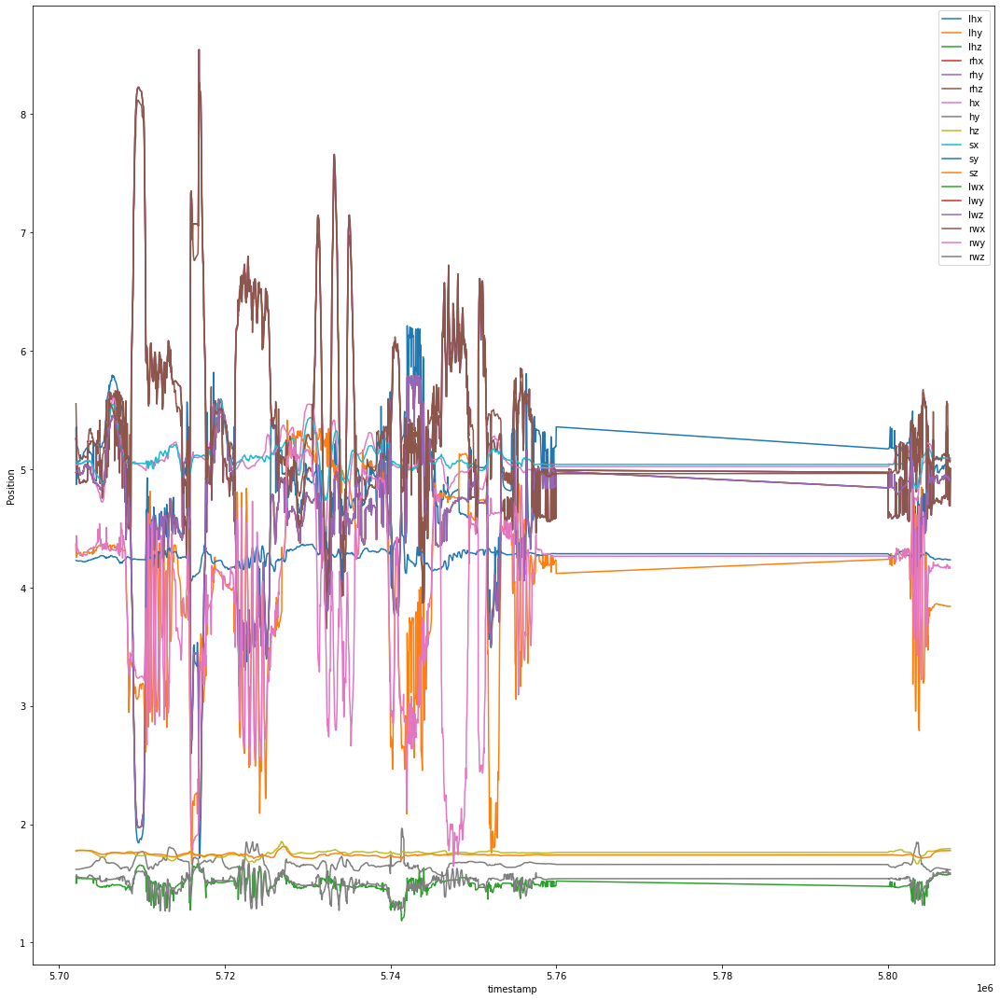

In [297]:
sns.lineplot(x='timestamp' ,y='lhx', data=df, label='lhx')
sns.lineplot(x='timestamp' ,y='lhy', data=df, label='lhy')
sns.lineplot(x='timestamp' ,y='lhz', data=df, label='lhz')
sns.lineplot(x='timestamp' ,y='rhx', data=df, label='rhx')
sns.lineplot(x='timestamp' ,y='rhx', data=df, label='rhy')
sns.lineplot(x='timestamp' ,y='rhx', data=df, label='rhz')
sns.lineplot(x='timestamp' ,y='hx', data=df, label='hx')
sns.lineplot(x='timestamp' ,y='hy', data=df, label='hy')
sns.lineplot(x='timestamp' ,y='hz', data=df, label='hz')
sns.lineplot(x='timestamp' ,y='sx', data=df, label='sx')
sns.lineplot(x='timestamp' ,y='sy', data=df, label='sy')
sns.lineplot(x='timestamp' ,y='sz', data=df, label='sz')
sns.lineplot(x='timestamp' ,y='lwx', data=df, label='lwx')
sns.lineplot(x='timestamp' ,y='lwx', data=df, label='lwy')
sns.lineplot(x='timestamp' ,y='lwx', data=df, label='lwz')
sns.lineplot(x='timestamp' ,y='rwx', data=df, label='rwx')
sns.lineplot(x='timestamp' ,y='rwy', data=df, label='rwy')
sns.lineplot(x='timestamp' ,y='rwz', data=df, label='rwz')
plt.ylabel("Position")

Text(0, 0.5, 'X')

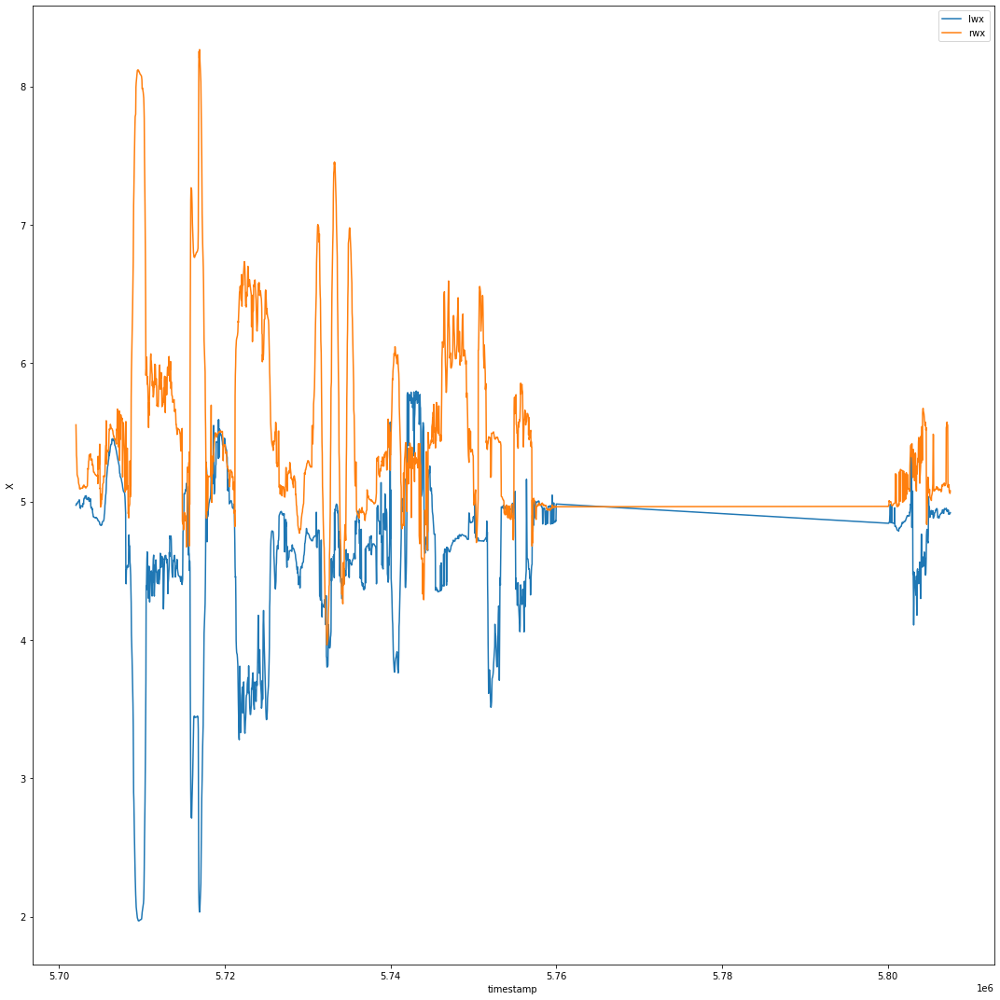

In [293]:
sns.lineplot(x='timestamp' ,y='lhx', data=df, label='lhx')
sns.lineplot(x='timestamp' ,y='rhx', data=df, label='rhx')
sns.lineplot(x='timestamp' ,y='hx', data=df, label='hx')
sns.lineplot(x='timestamp' ,y='sx', data=df, label='sx')
sns.lineplot(x='timestamp' ,y='lwx', data=df, label='lwx')
sns.lineplot(x='timestamp' ,y='rwx', data=df, label='rwx')
plt.ylabel("X")

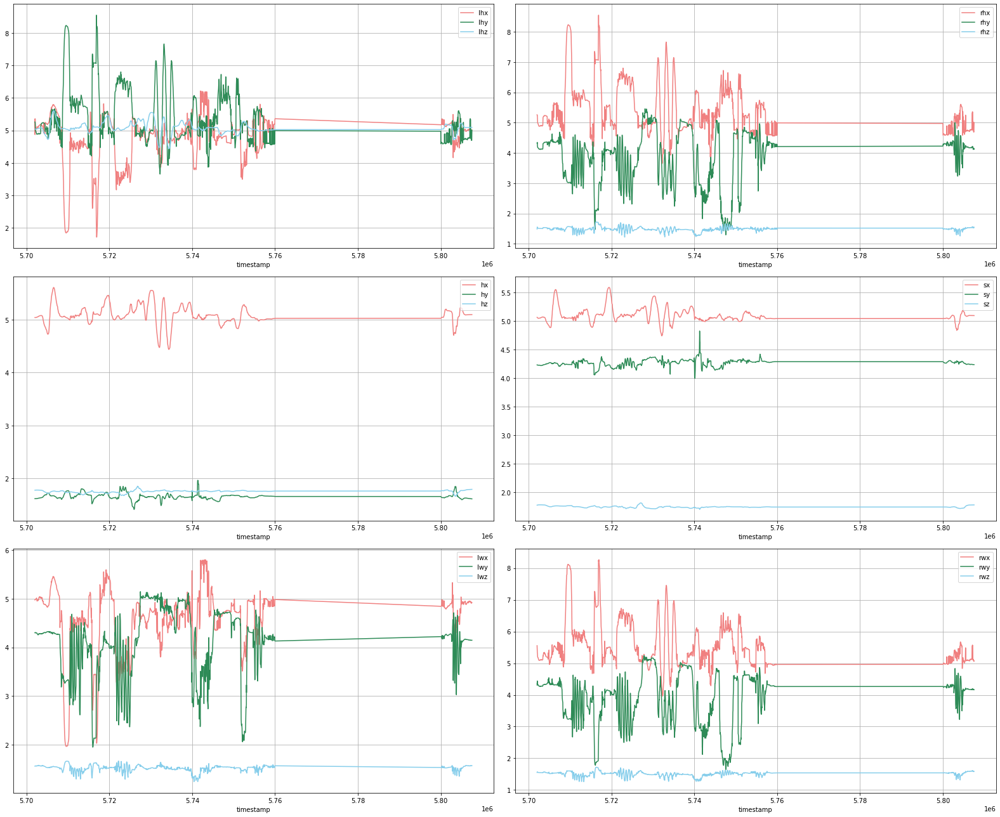

In [285]:
fig, axes =  plt.subplots(3,2,figsize=(22,18))
# Graph lhx,lhy,lhz compare to timestamp
axes[0][0].set_xlabel('timestamp')
axes[0][0].grid()
axes[0][0].plot(df['timestamp'],df['lhx'], color='lightcoral',label='lhx')
axes[0][0].plot(df['timestamp'],df['lhy'], color='seagreen',label='lhy')
axes[0][0].plot(df['timestamp'],df['lhz'], color='skyblue',label='lhz')
axes[0][0].legend(loc='upper right')

# Graph rhx,rhy,rhz compare to timestamp
axes[0][1].set_xlabel('timestamp')
axes[0][1].grid()
axes[0][1].plot(df['timestamp'],df['rhx'], c='lightcoral',label='rhx')
axes[0][1].plot(df['timestamp'],df['rhy'], c='seagreen',label='rhy')
axes[0][1].plot(df['timestamp'],df['rhz'], c='skyblue',label='rhz')
axes[0][1].legend(loc='upper right')

# Graph hx,hy,hz compare to timestamp
axes[1][0].set_xlabel('timestamp')
axes[1][0].grid()
axes[1][0].plot(df['timestamp'],df['hx'], c='lightcoral',label='hx')
axes[1][0].plot(df['timestamp'],df['hy'], c='seagreen',label='hy')
axes[1][0].plot(df['timestamp'],df['hz'], c='skyblue',label='hz')
axes[1][0].legend(loc='upper right')

# Graph sx,sy,sz compare to timestamp
axes[1][1].set_xlabel('timestamp')
axes[1][1].grid()
axes[1][1].plot(df['timestamp'],df['sx'], c='lightcoral',label='sx')
axes[1][1].plot(df['timestamp'],df['sy'], c='seagreen',label='sy')
axes[1][1].plot(df['timestamp'],df['sz'], c='skyblue',label='sz')
axes[1][1].legend(loc='upper right')

# Graph lwx,lwy,lwz compare to timestamp
axes[2][0].set_xlabel('timestamp')
axes[2][0].grid()
axes[2][0].plot(df['timestamp'],df['lwx'], c='lightcoral',label='lwx')
axes[2][0].plot(df['timestamp'],df['lwy'], c='seagreen',label='lwy')
axes[2][0].plot(df['timestamp'],df['lwz'], c='skyblue',label='lwz')
axes[2][0].legend(loc='upper right')

# Graph rwx,rwy,rwz compare to timestamp
axes[2][1].set_xlabel('timestamp')
axes[2][1].grid()
axes[2][1].plot(df['timestamp'],df['rwx'], c='lightcoral',label='rwx')
axes[2][1].plot(df['timestamp'],df['rwy'], c='seagreen',label='rwy')
axes[2][1].plot(df['timestamp'],df['rwz'], c='skyblue',label='rwz')
axes[2][1].legend(loc='upper right')

### ลองเทียบช่วงไหนเป็นphraseไหน

## Create array of data

In [229]:
Row_list =[]
  
# Iterate over each row
for index, rows in df.iterrows():
    # Create list for the current row
    my_list =[rows.lhx, rows.lhy, rows.lhz, 
              rows.rhx, rows.rhy, rows.rhz, 
              rows.hx, rows.hy, rows.hz, 
              rows.sx, rows.sy, rows.sz, 
              rows.lwx, rows.lwy, rows.lwz, 
              rows.rwx, rows.rwy, rows.rwz]
      
    # append the list to the final list
    Row_list.append(my_list)

Row_arr = np.asarray(Row_list)
Row_arr

array([[5.347435, 4.363681, 1.501913, ..., 5.553945, 4.370456, 1.553521],
       [4.869622, 4.25421 , 1.556133, ..., 5.423875, 4.303708, 1.569942],
       [5.357447, 4.364039, 1.500969, ..., 5.33217 , 4.438061, 1.572841],
       ...,
       [4.996975, 3.841236, 1.578423, ..., 5.074112, 4.178266, 1.581682],
       [5.000125, 3.841455, 1.577914, ..., 5.058132, 4.166863, 1.57969 ],
       [5.0079  , 3.841846, 1.576601, ..., 5.0767  , 4.163444, 1.586362]])

<h2>Silhouette Method</h2>

In [134]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

For n_clusters = 5 The average silhouette_score is : 0.3220507386939165
For n_clusters = 6 The average silhouette_score is : 0.35468696659123033
For n_clusters = 7 The average silhouette_score is : 0.3773381767890623
For n_clusters = 8 The average silhouette_score is : 0.38775221711415636
For n_clusters = 9 The average silhouette_score is : 0.40859640552129256
For n_clusters = 10 The average silhouette_score is : 0.4130967678624252
For n_clusters = 11 The average silhouette_score is : 0.4135913913996856
For n_clusters = 12 The average silhouette_score is : 0.37248290939292544
For n_clusters = 13 The average silhouette_score is : 0.3776120950923483
For n_clusters = 14 The average silhouette_score is : 0.3958839197791004
For n_clusters = 15 The average silhouette_score is : 0.3970239209818935
For n_clusters = 16 The average silhouette_score is : 0.38301517133684376
For n_clusters = 17 The average silhouette_score is : 0.3836597687831439
For n_clusters = 18 The average silhouette_score is

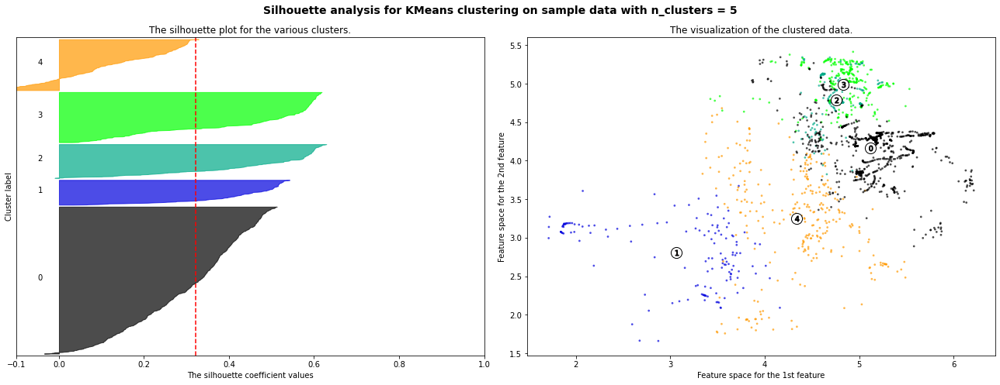

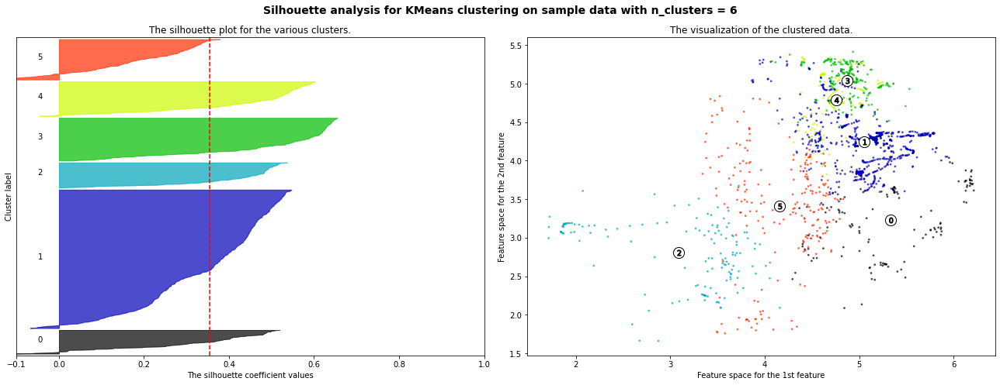

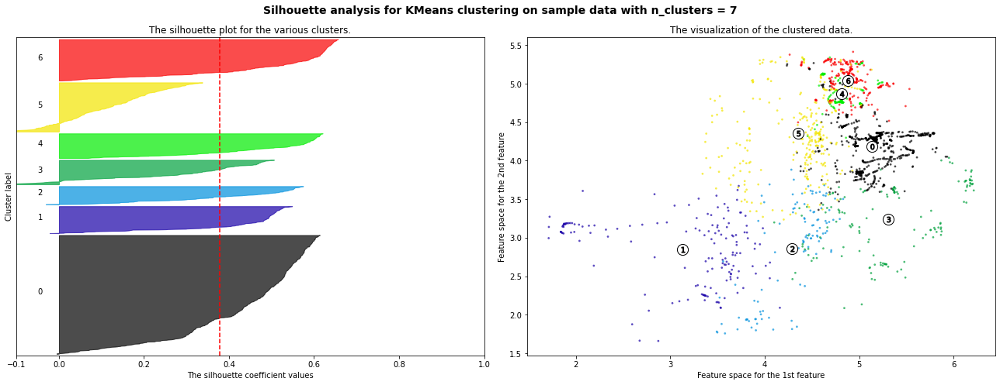

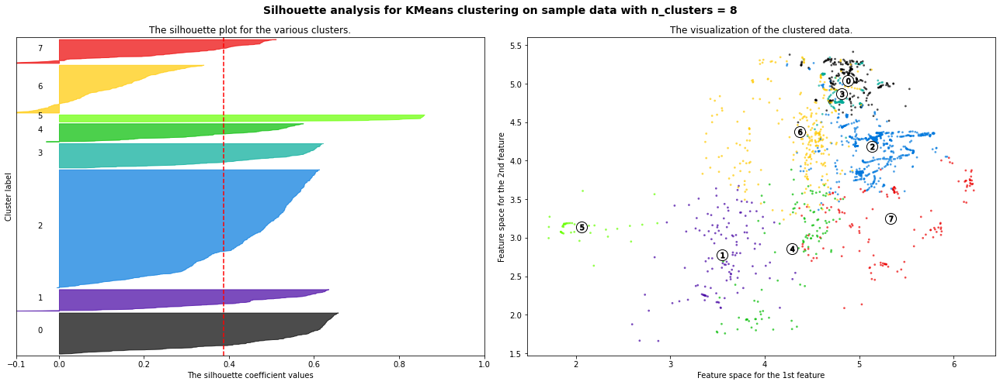

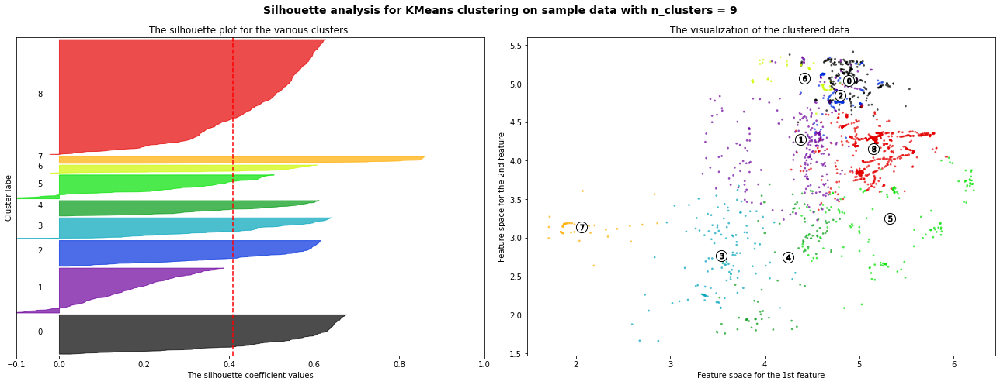

...

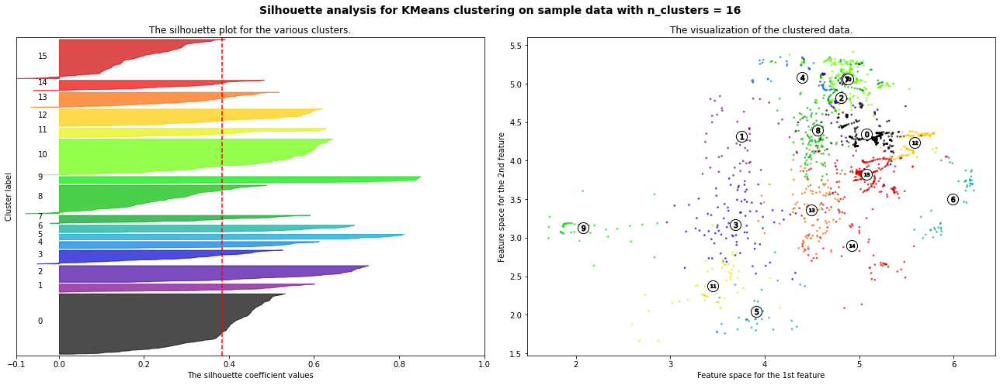

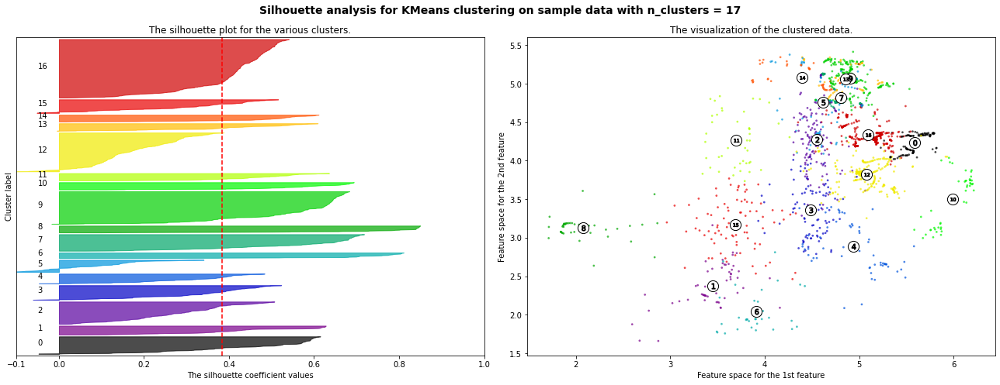

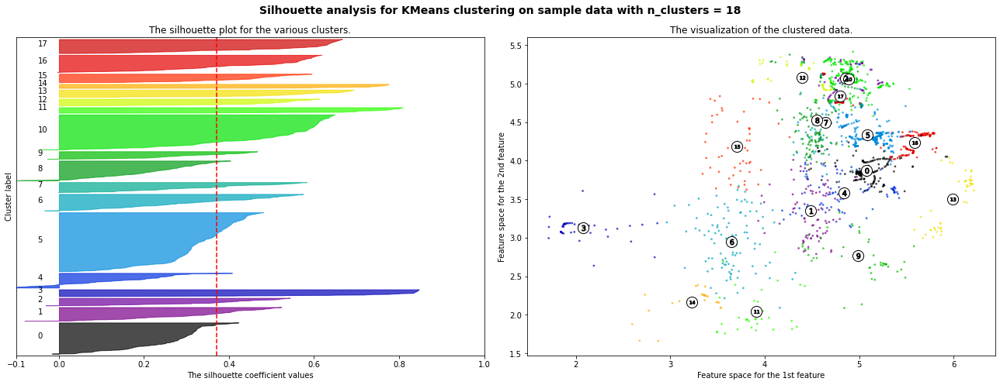

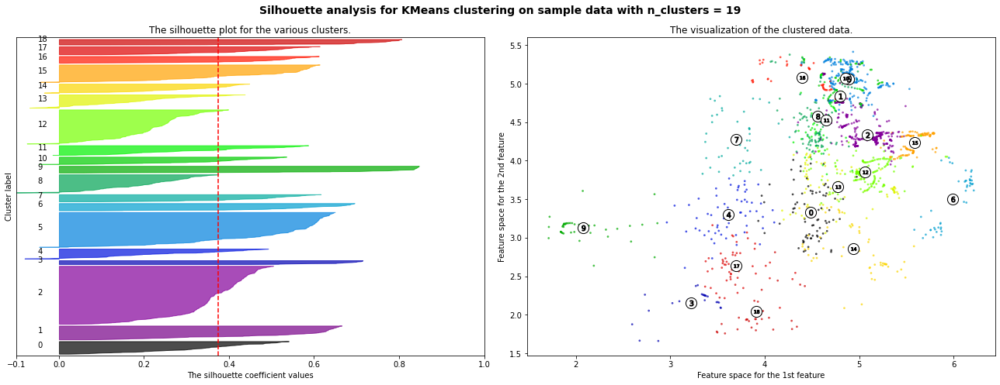

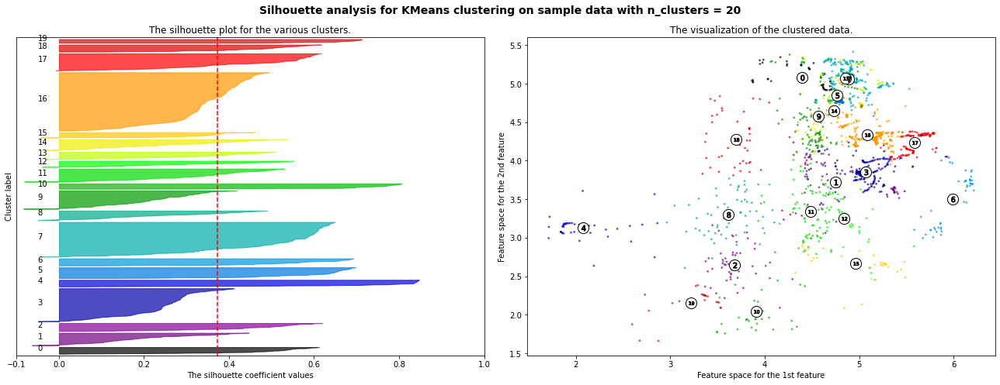

In [230]:
# Set X to array of data
X = Row_arr

# Range of cluster 5 - 20
range_n_clusters = [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

## From silhouette analysis the best values from 5-20 is 10,11. So I pick K value to 11 because it's the most value equal to 1 and the graph look balance

# K Means Cluster Creation

In [260]:
kmeans = KMeans(n_clusters=11).fit(X)
y_kmeans = kmeans.predict(X)
y_kmeans

array([5, 5, 5, ..., 5, 5, 5], dtype=int32)

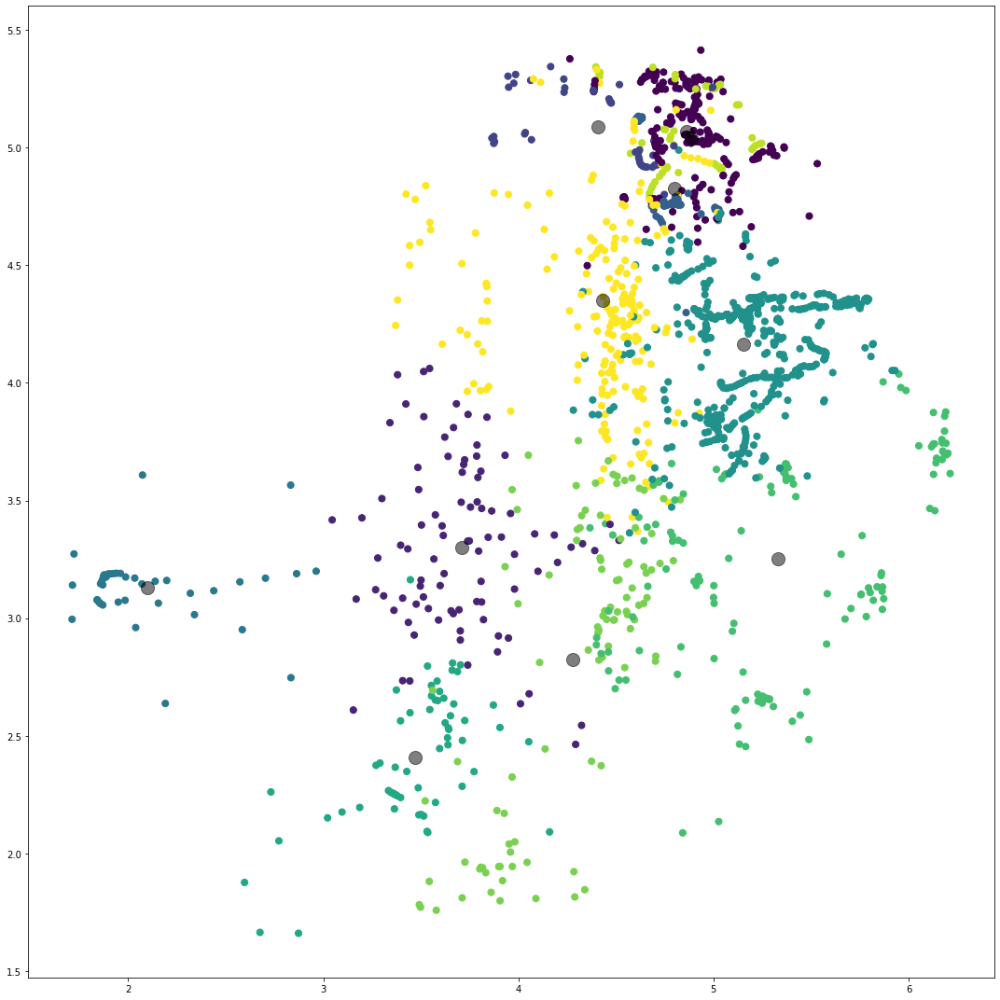

In [261]:
plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap='viridis')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)
plt.rcParams["figure.figsize"] = (15,15)

# 2

In [302]:
df = pd.read_csv('gesture_phrase_dataset/a2_raw.csv')

FileNotFoundError: [Errno 2] No such file or directory: 'gesture_phrase_dataset/a2_raw.csv'